# This pipeline runs spatial analysis for 10X visium data
## Prepare pipeline environment
To run this pipline, we recommend to use the docker contianer. That page describes how to run the pipeline using docker. If you are using HPC, then it's recommended to run this pipeline using singularity. You can download the docker image using singularity with the command: <br/> 
> **singularity pull docker://shl198/sc_ppl:v1**. <br/>

Singularity image file is not writable, you can transfer it to a sandbox and then you will be able to install packages inside it without administrator role. The commands are:
> singularity build --sandbox sc_pipeline/ sc_ppl.sif <br/>
> singularity run -w sc_pipeline jupyter-lab --no-browser --port 8887

In the end, you can open jupyter-lab by copying and pasting the url shown in terminal.

This is a new batch of two samples which uses visium v2 platform, which sequences more genes than v1 platform

# 0. Load packages

In [1]:
import scanpy as sc
import anndata as ad
import squidpy as sq
import scanorama
import math
import sys

import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns
from bioinfokit import visuz

import numpy as np
import pandas as pd
import glob
import os

import warnings
warnings.filterwarnings("ignore")

import stlearn as st

sc.logging.print_header()
print(f"squidpy=={sq.__version__}")
sys.path.insert(1, os.path.join(sys.path[0], '..'))

2023-05-08 10:28:38.579811: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-08 10:28:39.149885: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /hpc/grid/lsfhpcprod/10.1/linux3.10-glibc2.17-x86_64/lib:/.singularity.d/libs
2023-05-08 10:28:39.149913: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-05-08 10:28:41.431254: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.1 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.8
squidpy==1.2.3


In [2]:
import importlib
import utils.visium_modules as vis
importlib.reload(vis)

<module 'utils.visium_modules' from '/home/lis262/Code/scRNASeq_spatial/spatial_pipeline/projects/../utils/visium_modules.py'>

# 1. Preprocessing
## 1.1 Load data

In [3]:
path = '/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf'
# work_path = f'{path}/p01_visium_20220819/Analysis'
work_path = f'{path}/p02_visium_20230308/Analysis'
raw_path = f'{work_path}/f01_raw'
file_pres = [f for f in sorted(glob.glob(f'{raw_path}/*')) if os.path.isdir(f)]

sasp_gene_fn = f'{path}/senecense_SASP.txt'
sasp_genes = pd.read_csv(sasp_gene_fn,header=None)[0].to_list()
senmyo_gene_fn = f'{path}/senmyo.txt'
senmyo_genes = pd.read_csv(senmyo_gene_fn,header=None)[0].to_list()
fibro_gene_fn = f'{path}/fibro_genes.txt'
fibro_genes = pd.read_csv(fibro_gene_fn,header=None)[0].to_list()

In [4]:
cirr_genes = ['CLEC11A', 'COL3A1', 'COL5A1', 'COL5A2', 'COL6A3','CRABP2', 
              'CTHRC1', 'ISLR', 'PDGFRA', 'THY1']

### !!! Note: before reading the files, you need to go into the data spatial folder and change file name of tissue_positions.csv to tissue_positions_list.csv and also remove the header: 
barcode | in_tissue | array_row | array_col | pxl_row_in_fullres | pxl_col_in_fullres

In [4]:
adata_list, samples = vis.get_adata_list(file_pres)

## 1.2 Plot QC plots
Distribution of total_counts, distribution of n_genes_by_counts(The number of genes with at least 1 count in a cell)

In [ ]:
for ad in adata_list:
    vis.qc_plots(ad)

In [ ]:
# #adata_list[0] = adata_list[0][adata_list[0].obs['mt_frac'] < 0.06]
# adata_list[1] = adata_list[1][adata_list[1].obs['mt_frac'] < 0.06]

# for ad in adata_list:
#     print('Number of cells before MT filter: {:d}'.format(ad.n_obs))
#     ad = ad[ad.obs['mt_frac'] < 0.06]
#     print('Number of cells after MT filter: {:d}'.format(ad.n_obs))

## 1.3 Normalize each sample separately

In [235]:
vis.norm_hv_gene(adata_list)

# 2. Analyze one sample first

## 2.1 Clustering

In [ ]:
sc.pp.pca(ann_sp, svd_solver='arpack')
sc.pl.pca_variance_ratio(ann_sp)

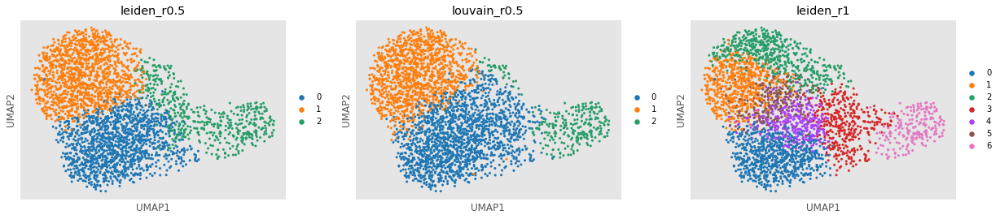

In [17]:
# cluster using umap and leiden
sc.pp.pca(ann_sp, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(ann_sp)
sc.tl.umap(ann_sp)
sc.tl.leiden(ann_sp, key_added='leiden_r1',resolution=1)
sc.tl.leiden(ann_sp, key_added='leiden_r0.5',resolution=0.5)
sc.tl.louvain(ann_sp, key_added='louvain_r0.5',resolution=0.5)
sc.pl.umap(ann_sp, color=['leiden_r0.5','louvain_r0.5','leiden_r1'], palette=sc.pl.palettes.default_20)

# 2 Integrate data clustering

## 2.1 Integrate data using scanorama

In [236]:
adatas_cor = scanorama.correct_scanpy(adata_list, return_dimred=True)

Found 18028 genes among all datasets
[[0.           0.0774062817]
 [0.           0.          ]]


In [237]:
adata_spatial = sc.concat(adatas_cor, label="library_id", uns_merge="unique",
    keys=[k for d in [ad.uns['spatial'] for ad in adatas_cor] for k, v in d.items()], index_unique="-",)
adata_spatial.raw = adata_spatial

In [238]:
adata_spatial.obs['sample'].value_counts()

cirrhosis    4935
normal_11    4651
Name: sample, dtype: int64

## 2.2 Clustering and UMAP
Using leiden method on scanorama embeddings

In [243]:
sc.pp.neighbors(adata_spatial, use_rep="X_scanorama")
sc.tl.umap(adata_spatial)
sc.tl.leiden(adata_spatial, key_added="clusters", resolution=0.5)

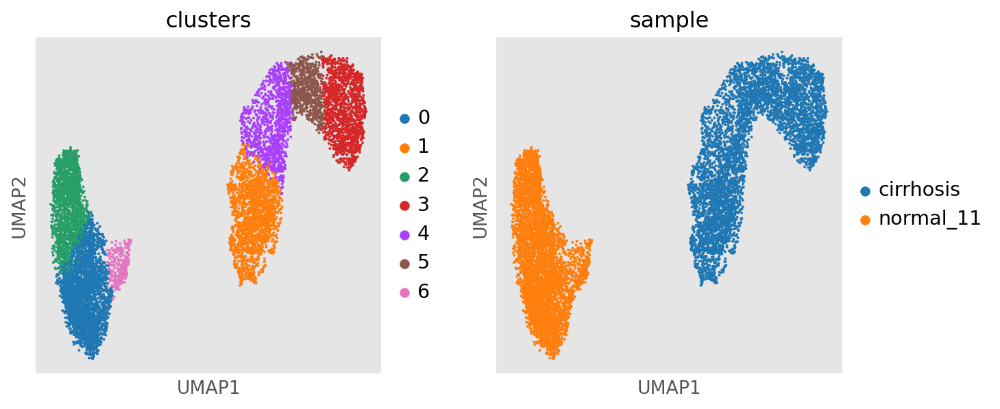

In [244]:
sc.set_figure_params()
plt.style.use('ggplot')
sc.pl.umap(adata_spatial, color=["clusters", "sample"], palette=sc.pl.palettes.default_20)

In [246]:
clusters_colors = dict(zip([str(i) for i in range(18)], adata_spatial.uns["clusters_colors"]))

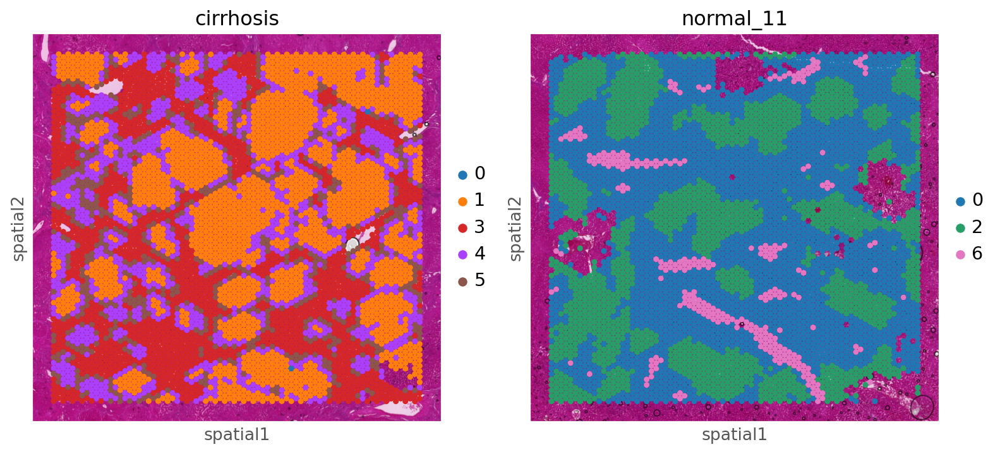

In [247]:
ncol = 2
fig, axs = plt.subplots(math.ceil(len(adatas_cor)/ncol), ncol, figsize=(10, 5))
lib_sp_dict = adata_spatial.obs.set_index('library_id')['sample'].to_dict()
for i, library in enumerate(adata_spatial.uns['spatial'].keys()):
    # col = i % ncol
    # row = i // ncol
    ad = adata_spatial[adata_spatial.obs.library_id == library, :].copy()
    sc.pl.spatial(ad, img_key="hires", library_id=library, color="clusters", size=1.5, title=lib_sp_dict[library],
                  palette=[v for k, v in clusters_colors.items() if k in ad.obs.clusters.unique().tolist()],
        show=False, ax=axs[i])
plt.tight_layout()

In [14]:
print('number of cell in each cluster')
adata_spatial.obs['clusters'].value_counts()

number of cell in each cluster


0    1756
1    1657
2    1378
3    1265
4     993
5     839
6     764
7     739
8     557
Name: clusters, dtype: int64

In [248]:
sc.tl.rank_genes_groups(adata_spatial, groupby='clusters')

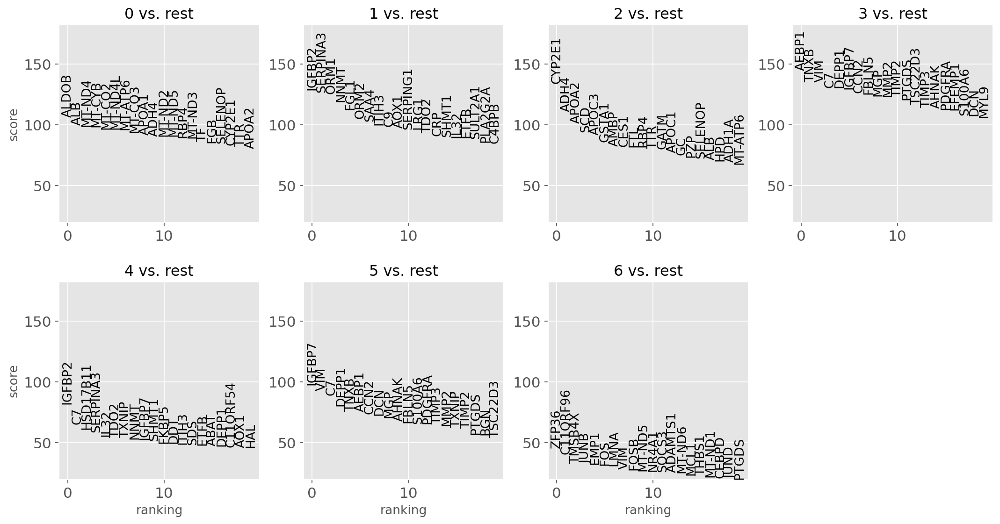

In [249]:
sc.pl.rank_genes_groups(adata_spatial, fontsize=12)

## 2.3 Determine fibrotic levels for clusters

In [16]:
# check fibrotic genes for each cluster
fibro_genes = list(set(fibro_genes).intersection(adata_spatial.var.index.tolist()))
sc.tl.dendrogram(adata_spatial, groupby='clusters', use_rep='X_scanorama')
adata_spatial.layers['scaled'] =  sc.pp.scale(adata_spatial.X)

In [17]:
fibro_adata = adata_spatial[:,fibro_genes].copy()
sc.tl.dendrogram(fibro_adata, groupby='clusters', use_rep='X_scanorama')

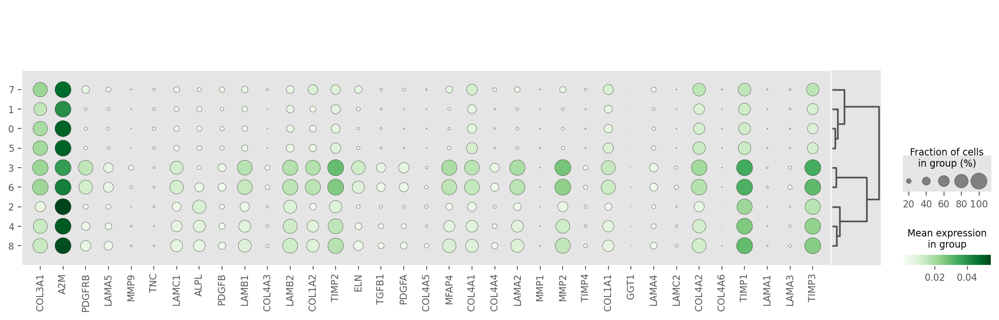

In [18]:
col_genes = [g for g in fibro_genes if g.startswith('COL')]
# dotplot for fibrotic genes 
sc.pl.dotplot(fibro_adata, fibro_genes, 'clusters', dendrogram=True, cmap='Greens')

In [ ]:
# matrix plot for fibrotic genes
sc.pl.matrixplot(fibro_adata, fibro_genes, 'clusters', cmap='bwr', layer='scaled', colorbar_title='mean z-score', vmin=-2, vmax=2, dendrogram=True)

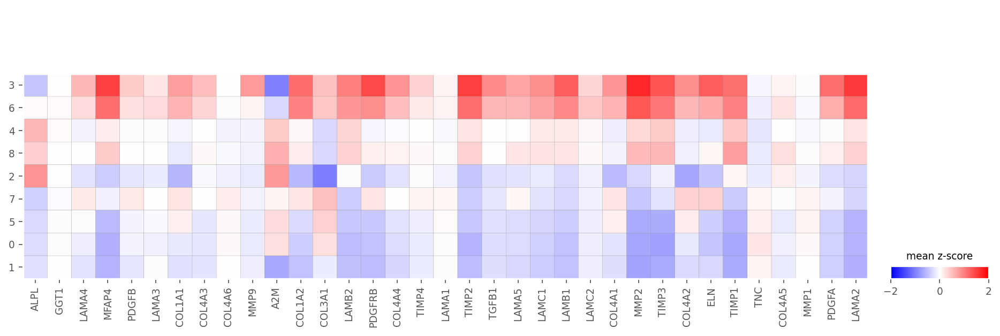

In [31]:
sc.pl.MatrixPlot.DEFAULT_COLOR_LEGEND_TITLE = 'mean z-score'
sc.pl.MatrixPlot.DEFAULT_COLORMAP= 'bwr'
sc.pl.MatrixPlot(fibro_adata, fibro_genes, 'clusters', layer='scaled', vmin=-2, vmax=2, categories_order=['3','6','4','8','2','7','5','0','1']).show()
sc.pl.MatrixPlot.DEFAULT_COLOR_LEGEND_TITLE= 'Mean expression\nin group'

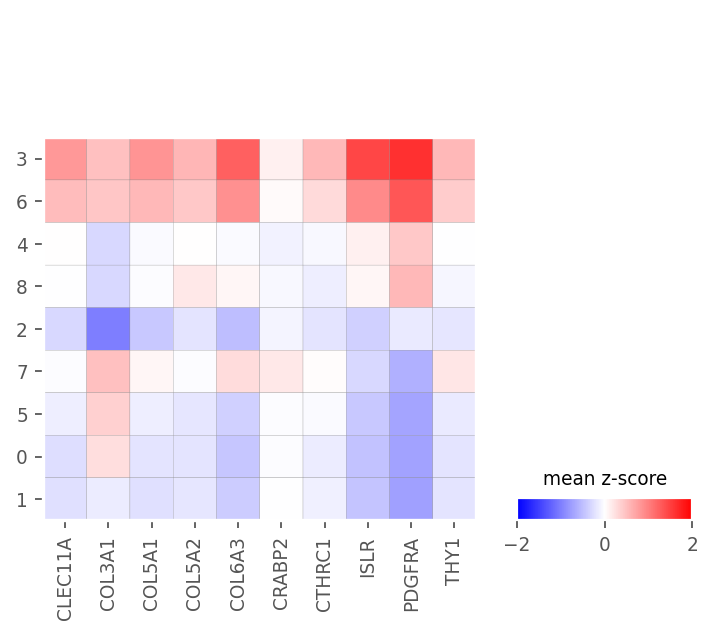

In [42]:
aHSC_genes = ['CLEC11A', 'COL3A1', 'COL5A1', 'COL5A2', 'COL6A3', 'CRABP2', 'CTHRC1', 'ISLR', 'PDGFRA', 'THY1']
sc.pl.MatrixPlot.DEFAULT_COLOR_LEGEND_TITLE = 'mean z-score'
sc.pl.MatrixPlot.DEFAULT_COLORMAP= 'bwr'
sc.pl.MatrixPlot(adata_spatial, aHSC_genes, 'clusters', layer='scaled', vmin=-2, vmax=2, categories_order=['3','6','4','8','2','7','5','0','1']).show()
sc.pl.MatrixPlot.DEFAULT_COLOR_LEGEND_TITLE= 'Mean expression\nin group'

In [ ]:
# plot fibrotic genes in each cluster for samples separately
for sp in adata_spatial.obs['sample'].unique():
    ad = adata_spatial[adata_spatial.obs['sample'] == sp,:].copy()
    clusters = ad.obs['clusters'].unique().tolist()
    if len(clusters) > 1:
        sc.tl.dendrogram(ad, groupby='clusters', use_rep='X_scanorama')
        sc.pl.dotplot(ad, fibro_genes, 'clusters',title=sp, dendrogram=True, vmin=0, vmax=0.1)
    else:
        sc.pl.dotplot(ad, fibro_genes, 'clusters',title=sp)

## 2.4 Check number of senescent cells in each cluster

In [93]:
sub = adata_list[0].copy()

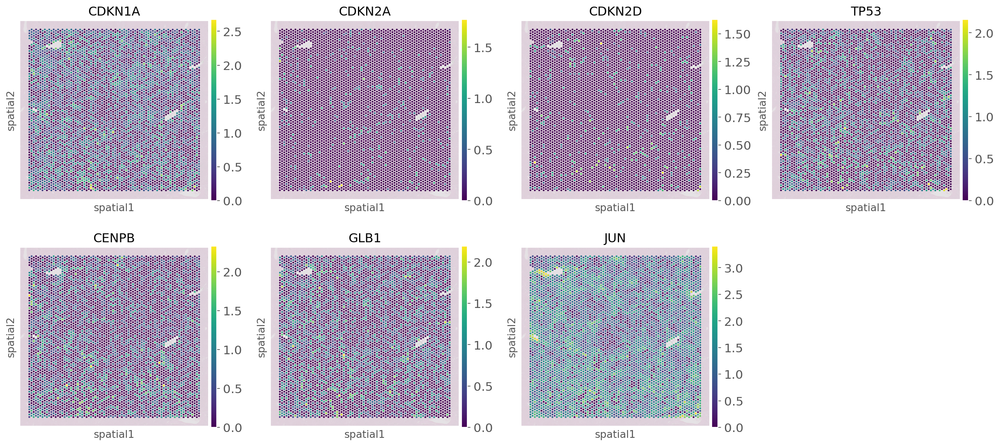

In [201]:
sene_genes = ['CDKN1A','CDKN2A', 'CDKN2D', 'TP53', 'CENPB', 'GLB1','JUN']
sc.pl.spatial(sub, color=sene_genes, use_raw=True, alpha_img=0.1)

In [19]:
def filter_spots_by_sum_gene(adata, genes, log_threshold=0, rings=3):
    '''filter spots based on genes expressoin
    * log_threshold: usually raw data of anndata stores log normalized data.
    * rings: number of rings surrond the target spots, will not be considered as control spots
    
    return: 
        * target spot indexes.
        * ring spot indexes
        * the rest control indexes
    '''
    sub = adata.copy()
    sub = sub[sub.raw[:,genes].X.sum(1) >= log_threshold]
    # for g in genes:
    #     sub = sub[sub.raw[:,g].X > 0]
        
    all_cells = adata.obs.index.tolist()
    target_cells = sub.obs.index.tolist()
    target_index = [all_cells.index(c) for c in target_cells]
    # get ring spots
    sq.gr.spatial_neighbors(adata, n_rings=rings, coord_type="grid", n_neighs=6)
    _, idx = adata.obsp["spatial_connectivities"][target_index, :].nonzero()
    close_ring_idx = list(set(idx)) + target_index
    ring_cells = [all_cells[i] for i in close_ring_idx if all_cells[i] not in target_cells]
    norm_cells = list(set(all_cells) - set(ring_cells) - set(target_cells))
    
    return target_cells, ring_cells, norm_cells 

In [20]:
def get_sene_spots(adata_list, genes, adata_spatial, label_col_name):
    # 1. get phenotype cells: senescence cells in this example
    all_sene_cells = []
    all_ring_cells = []
    all_norm_cells = []
    for ad in adata_list:
        sp = list(ad.uns['spatial'].keys())[0]
        sene_cells, ring_cells, norm_cells = filter_spots_by_sum_gene(ad,genes, log_threshold=4)
        all_sene_cells.extend([f'{c}-{sp}' for c in sene_cells])
        all_ring_cells.extend([f'{c}-{sp}' for c in ring_cells])
        all_norm_cells.extend([f'{c}-{sp}' for c in norm_cells])
    
    adata_spatial.obs[label_col_name] = 'other'
    adata_spatial.obs.loc[all_ring_cells,label_col_name] = 'ring'
    adata_spatial.obs.loc[all_sene_cells,label_col_name] = 'sene'

# genes = ['CDKN1A','GLB1', 'HMGB1']
sene_genes = ['CDKN1A','CDKN2A', 'CDKN2D', 'TP53', 'CENPB', 'GLB1']
label_col_name = 'sene_cluster'
get_sene_spots(adata_list, sene_genes, adata_spatial, label_col_name)

Text(0.5, 1.0, 'senescent cells distribution in each cluster')

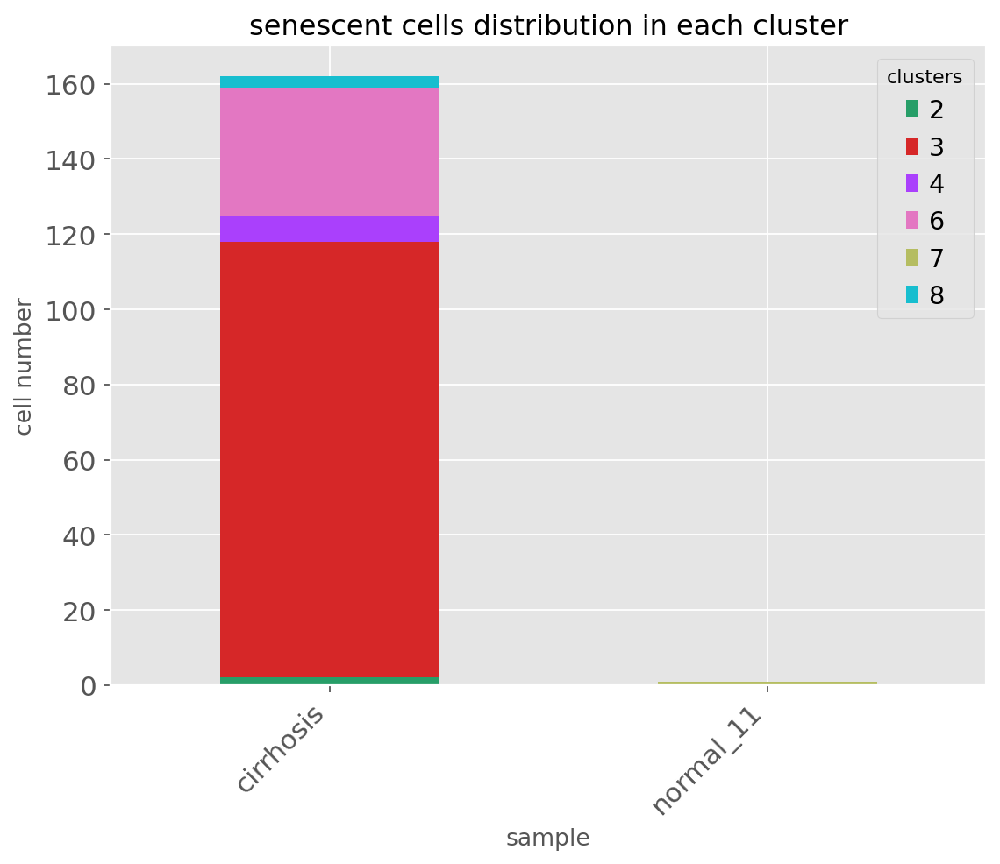

In [21]:
sene_cell_df = adata_spatial.obs.query('sene_cluster == "sene"').copy()
count_df = sene_cell_df[['sample','clusters']].value_counts().to_frame().reset_index()
count_df.rename(columns={0:'count'},inplace=True)
pivot_df = pd.pivot_table(data=count_df, index=['sample'], columns=['clusters'], values='count')
ax = pivot_df.plot.bar(stacked=True, figsize=(8,6), rot=45, color=clusters_colors)
labels = ax.get_xticklabels()
_ = ax.set_xticklabels(labels, ha='right')
ax.set_ylabel('cell number')
ax.set_title('senescent cells distribution in each cluster')

In [22]:
# save spatial data into inter_h5ad folder
inter_adata_folder = f'{work_path}/f02_inter_h5ad'
os.makedirs(inter_adata_folder, exist_ok=True)
adata_spatial.write(f'{inter_adata_folder}/cirr_norm.h5ad')

In [175]:
adata_spatial = sc.read_h5ad(f'{work_path}/f02_inter_h5ad/cirr_norm.h5ad')
adata_spatial.uns['log1p']['base'] = None

# 3 Downstream analysis

In [50]:
adata_spatial.X[adata_spatial.X < 0] = 0

In [8]:
def de_genes_violin(adata_spatial, test_label, key, de_res_fn):
    ''' violin plot for significant genes
    * key: rank_gene_group key
    '''  
    
    all_sene_df = pd.read_csv(de_res_fn, sep='\t',header=0)
    all_sene_df, up_genes, dn_genes = vis.get_sig_de_genes(all_sene_df, test_label)

    print('number of up genes:',len(up_genes))
    print('number of down genes:',len(dn_genes))

    print('up genes overlap with sasp genes:', len(set(up_genes).intersection(sasp_genes)))
    print('dn genes overlap with sasp genes:', len(set(dn_genes).intersection(sasp_genes)))
    print('up genes overlap with senmyo genes:', len(set(up_genes).intersection(senmyo_genes)))
    print('dn genes overlap with senmyo genes:', len(set(dn_genes).intersection(senmyo_genes)))

    fig, axes = plt.subplots(1, 2, figsize=(18, 6))
    plot_genes = all_sene_df[f'{test_label}_names'].tolist()[:20]
    sc.pl.rank_genes_groups_violin(adata_spatial, groups=test_label, gene_names=plot_genes, ax=axes[0], key=key, show=False, use_raw=True)

    plot_genes = all_sene_df.query(f'{test_label}_names in @sasp_genes')[f'{test_label}_names'].tolist()[:20]
    sc.pl.rank_genes_groups_violin(adata_spatial, groups=test_label, gene_names=plot_genes, ax=axes[1], key=key, show=False, use_raw=True)

## 3.1 DE analysis
### 3.1.1 sene cells (3,6) VS normal in (0, 1, 5)

In [66]:
def assign_sene_norm_group(row):
    if row['sene_cluster'] == 'sene' and row['clusters'] in ['3','6']:
        return 'sene'
    elif row['sene_cluster'] == 'other' and row['clusters'] in ['0','1','5']:
        return 'normal'
    else:
        return 'other'
adata_spatial.obs['group4de'] = adata_spatial.obs.apply(lambda row: assign_sene_norm_group(row), axis=1)
de_key = 'more_sene_VS_norm'
sc.tl.rank_genes_groups(adata_spatial, 'group4de', reference='normal', method='wilcoxon', groups=['sene','normal'], pts=True, key_added=de_key, use_raw=False)
print(adata_spatial.obs['group4de'].value_counts())
# extract de results
more_sene_vs_norm_df = vis.get_rank_genes_de_res(adata_spatial, de_key)
# output to file
de_path = f'{work_path}/f03_de'
os.makedirs(de_path, exist_ok=True)
de_fn = f'{de_path}/more_sene_VS_norm.tsv'
more_sene_vs_norm_df.to_csv(de_fn, sep='\t',index=False)

other     5572
normal    4226
sene       150
Name: group4de, dtype: int64


number of up genes: 5356
number of down genes: 327
up genes overlap with sasp genes: 14
dn genes overlap with sasp genes: 2
up genes overlap with senmyo genes: 42
dn genes overlap with senmyo genes: 8


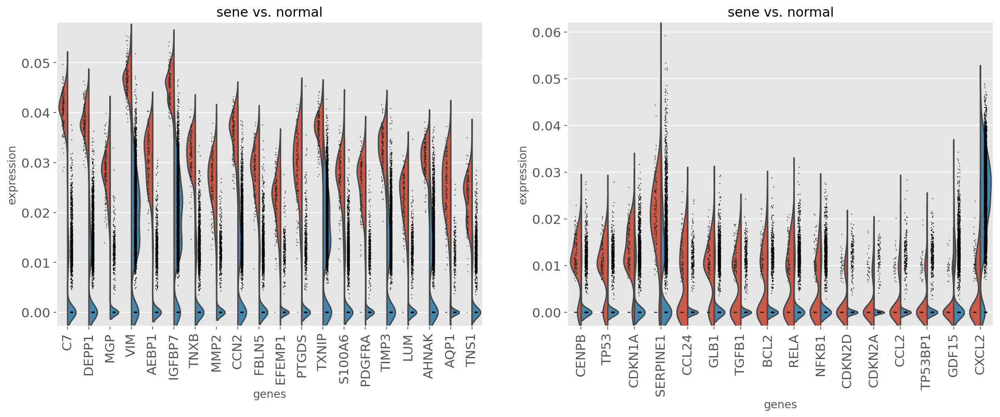

In [67]:
adata_spatial.obs['group4de'] = adata_spatial.obs.apply(lambda row: assign_sene_norm_group(row), axis=1)
de_fn = f'{de_path}/more_sene_VS_norm.tsv'
de_genes_violin(adata_spatial, 'sene', 'more_sene_VS_norm', de_fn)

### 3.1. 2 more sene in (3,6) VS less sene in cluster (4,8,2)

In [68]:
def assign_more_less_sene_group(row):
    if row['sene_cluster'] == 'sene' and row['clusters'] in ['3','6']:
        return 'sene'
    elif row['sene_cluster'] == 'sene' and row['clusters'] in ['4','8','2']:
        return 'sene_in_norm'
    else:
        return 'other'
adata_spatial.obs['group4de'] = adata_spatial.obs.apply(lambda row: assign_more_less_sene_group(row), axis=1)
de_key = 'more_sene_VS_less_sene'
sc.tl.rank_genes_groups(adata_spatial, 'group4de', reference='sene_in_norm', method='wilcoxon', groups=['sene','sene_in_norm'], pts=True, key_added=de_key, use_raw=True)
print(adata_spatial.obs['group4de'].value_counts())
# extract de results
more_sene_vs_less_sene_df = vis.get_rank_genes_de_res(adata_spatial, de_key)
# output to file
de_path = f'{work_path}/f03_de'
os.makedirs(de_path, exist_ok=True)
de_fn = f'{de_path}/more_sene_VS_less_sene.tsv'
more_sene_vs_less_sene_df.to_csv(de_fn, sep='\t',index=False)

other           9786
sene             150
sene_in_norm      12
Name: group4de, dtype: int64


number of up genes: 147
number of down genes: 284
up genes overlap with sasp genes: 1
dn genes overlap with sasp genes: 0
up genes overlap with senmyo genes: 2
dn genes overlap with senmyo genes: 3


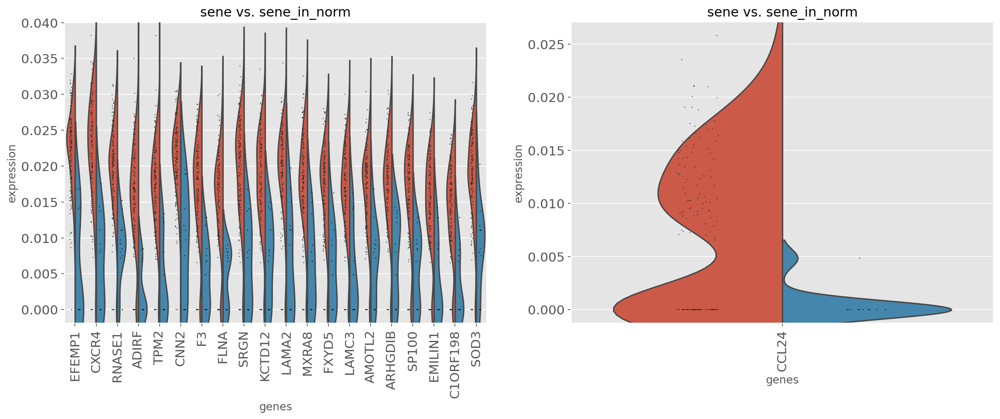

In [69]:
adata_spatial.obs['group4de'] = adata_spatial.obs.apply(lambda row: assign_more_less_sene_group(row), axis=1)
de_fn = f'{de_path}/more_sene_VS_less_sene.tsv'
de_genes_violin(adata_spatial, 'sene', 'more_sene_VS_less_sene', de_fn)

### 3.1.3 all sene VS norm in clusters (0,1,5)

In [70]:
def assign_all_sene_norm_group(row):
    if row['sene_cluster'] == 'sene':
        return 'sene'
    elif row['sene_cluster'] == 'other' and row['clusters'] in ['0','1','5']:
        return 'normal'
    else:
        return 'other'
adata_spatial.obs['group4de'] = adata_spatial.obs.apply(lambda row: assign_all_sene_norm_group(row), axis=1)
de_key = 'all_sene_VS_norm'
sc.tl.rank_genes_groups(adata_spatial, 'group4de', reference='normal', method='wilcoxon', groups=['sene','normal'], pts=True, key_added=de_key, use_raw=False)
print(adata_spatial.obs['group4de'].value_counts())
# extract de results
all_sene_vs_norm_df = vis.get_rank_genes_de_res(adata_spatial, de_key)
# output to file
de_path = f'{work_path}/f03_de'
os.makedirs(de_path, exist_ok=True)
de_fn = f'{de_path}/all_sene_VS_norm.tsv'
all_sene_vs_norm_df.to_csv(de_fn, sep='\t',index=False)

other     5559
normal    4226
sene       163
Name: group4de, dtype: int64


number of up genes: 5243
number of down genes: 273
up genes overlap with sasp genes: 14
dn genes overlap with sasp genes: 2
up genes overlap with senmyo genes: 42
dn genes overlap with senmyo genes: 5


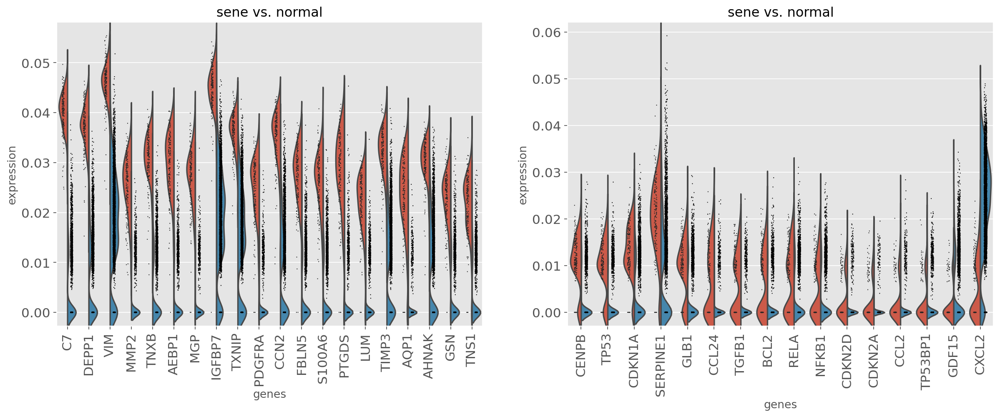

In [71]:
adata_spatial.obs['group4de'] = adata_spatial.obs.apply(lambda row: assign_all_sene_norm_group(row), axis=1)
de_fn = f'{de_path}/all_sene_VS_norm.tsv'
de_genes_violin(adata_spatial, 'sene', 'all_sene_VS_norm', de_fn)

### 3.1.4 fibrotic clusters (3,6,4,8) VS normal in (0,1,5)

In [72]:
def assign_fibro_normal_group(row):
    if row['clusters'] in ['3','6','4','8']:
        return 'fibro'
    elif row['clusters'] in ['0','1','5']:
        return 'normal'
    else:
        return 'other'
adata_spatial.obs['group4de'] = adata_spatial.obs.apply(lambda row: assign_fibro_normal_group(row), axis=1)
de_key = 'fibro_VS_norm'
sc.tl.rank_genes_groups(adata_spatial, 'group4de', reference='normal', method='wilcoxon', groups=['fibro','normal'], pts=True, key_added=de_key, use_raw=False)
print(adata_spatial.obs['group4de'].value_counts())
# extract de results
fibro_vs_norm_df = vis.get_rank_genes_de_res(adata_spatial, de_key)
# output to file
de_path = f'{work_path}/f03_de'
os.makedirs(de_path, exist_ok=True)
de_fn = f'{de_path}/fibro_VS_norm.tsv'
fibro_vs_norm_df.to_csv(de_fn, sep='\t',index=False)

normal    4252
fibro     3579
other     2117
Name: group4de, dtype: int64


number of up genes: 4265
number of down genes: 95
up genes overlap with sasp genes: 9
dn genes overlap with sasp genes: 1
up genes overlap with senmyo genes: 34
dn genes overlap with senmyo genes: 3


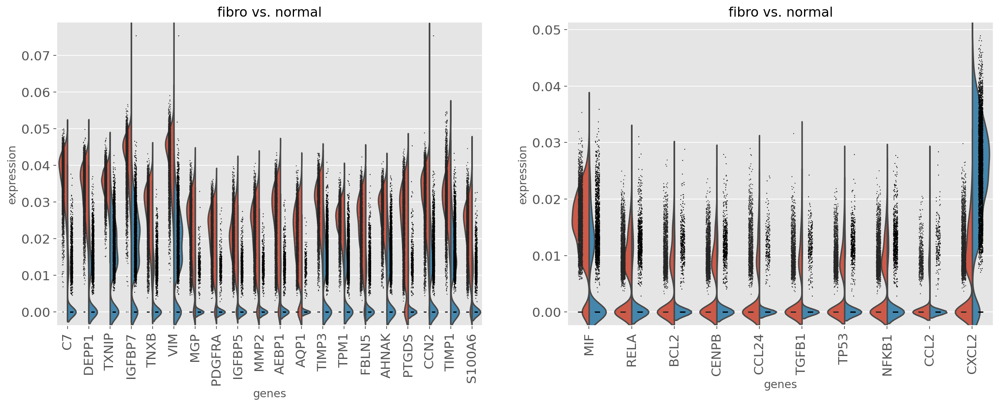

In [73]:
# plot violin plot for DE genes
adata_spatial.obs['group4de'] = adata_spatial.obs.apply(lambda row: assign_fibro_normal_group(row), axis=1)
de_fn = f'{de_path}/fibro_VS_norm.tsv'
de_genes_violin(adata_spatial, 'fibro', 'fibro_VS_norm', de_fn)

## Trajectory analysis

In [40]:
library_id = 'spaceranger_V42L06-053_A1'
cirr_adata = adata_spatial[adata_spatial.obs['library_id']==library_id,:].copy()
cirr_adata.uns['spatial'] = {library_id:cirr_adata.uns['spatial'][library_id]}
cirr_adata = st.convert_scanpy(cirr_adata)

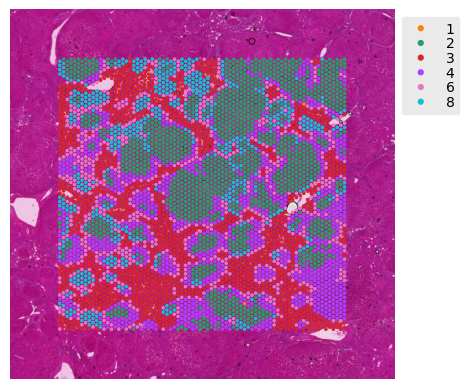

In [58]:
# cirr_adata = adata_spatial[adata_spatial.obs['sample']=='cirrhosis',:].copy()
st.pl.cluster_plot(cirr_adata, use_label="clusters",image_alpha=1,size=7)

In [59]:
cirr_adata.uns["iroot"] = st.spatial.trajectory.set_root(cirr_adata,use_label="clusters",cluster="3",use_raw=True)

In [60]:
st.spatial.trajectory.pseudotime(cirr_adata,eps=50,use_rep="X_scanorama",use_label="clusters")

All available trajectory paths are stored in adata.uns['available_paths'] with length < 4 nodes


In [65]:
cirr_adata.obs[['clusters','sub_cluster_labels']].value_counts()

clusters  sub_cluster_labels
2         2                     1360
3         1                     1256
4         0                      973
6         4                      752
8         3                      514
2         14                      13
8         6                       13
          11                      12
4         5                       10
          9                        9
8         13                       6
3         10                       6
8         22                       5
6         12                       5
2         7                        5
8         8                        4
6         23                       3
3         15                       3
6         16                       2
          17                       2
8         19                       1
          24                       1
1         20                       1
          21                       1
4         18                       1
8         25                       1
dtype: in

In [63]:
cirr_adata.obs.head()

,in_tissue,array_row,array_col,sample,cr_cluster,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,library_id,clusters,sene_cluster,imagecol,imagerow,sub_cluster_labels,dpt_pseudotime
AACACCTACTATCGAA-1-spaceranger_V42L06-053_A1,1,0,122,cirrhosis,8,5386,8.591744,26738.0,10.193878,52.561897,58.714190,63.733264,70.947715,spaceranger_V42L06-053_A1,4,other,754.969102,1404.383836,0,0.813335
AACACGTGCATCGCAC-1-spaceranger_V42L06-053_A1,1,76,22,cirrhosis,6,5149,8.546752,10482.0,9.257510,17.840107,23.087197,29.078420,40.183171,spaceranger_V42L06-053_A1,3,ring,189.997862,976.292776,1,0.050219
AACACTTGGCAAGGAA-1-spaceranger_V42L06-053_A1,1,47,71,cirrhosis,1,4769,8.470102,26513.0,10.185429,54.380870,60.992721,66.605062,74.125901,spaceranger_V42L06-053_A1,2,ring,405.533070,1185.954395,2,0.880840
AACAGGAAGAGCATAG-1-spaceranger_V42L06-053_A1,1,69,7,cirrhosis,1,5515,8.615408,30903.0,10.338641,50.082516,57.172443,62.967997,71.002815,spaceranger_V42L06-053_A1,2,ring,242.094050,912.194035,2,0.898257
AACAGGATTCATAGTT-1-spaceranger_V42L06-053_A1,1,49,43,cirrhosis,4,3752,8.230311,18295.0,9.814438,56.977316,62.962558,68.155234,75.616289,spaceranger_V42L06-053_A1,2,ring,390.721409,1066.269362,2,0.907676


In [61]:
cirr_adata.uns['available_paths']

{0: [5, 3, 4], 1: [5, 4], 2: [3, 5]}

In [ ]:
st.pl.cluster_plot(cirr_adata,use_label="clusters",show_trajectories=True,list_clusters=["3","8",'6'],show_subcluster=True)

## 3.2 ligand receptor analysis

In [9]:
adata_spatial.X = adata_spatial.raw.X.copy()
cirr_res = sq.gr.ligrec(
    adata_spatial[(adata_spatial.obs['sample']=='cirrhosis') & (adata_spatial.obs['clusters'] != "1"),:],
    n_perms=1000,
    cluster_key="clusters",
    copy=True,
    use_raw=False,
    transmitter_params={"categories": "ligand"},
    receiver_params={"categories": "receptor"},
    interactions_params={"resources": "CellPhoneDB"}
)

100%|█████████████████████████████| 1000/1000 [00:05<00:00, 197.93permutation/s]


In [10]:
adata_spatial.X = adata_spatial.raw.X.copy()
norm_res = sq.gr.ligrec(
    adata_spatial[adata_spatial.obs['sample']=='normal_11',:],
    n_perms=1000,
    cluster_key="clusters",
    copy=True,
    use_raw=False,
    transmitter_params={"categories": "ligand"},
    receiver_params={"categories": "receptor"},
    interactions_params={"resources": "CellPhoneDB"}
)

100%|█████████████████████████████| 1000/1000 [00:04<00:00, 241.86permutation/s]


In [11]:
cirr_res["means"].head()

cluster_1             2                                                 3  \
cluster_2             2         3         4         6         8         2   
source target                                                               
JAG2   NOTCH1  0.001360  0.003393  0.002000  0.002737  0.001788  0.002021   
DLL1   NOTCH1  0.001568  0.003601  0.002208  0.002945  0.001995  0.003774   
JAG1   NOTCH1  0.002193  0.004226  0.002833  0.003571  0.002621  0.005845   
CNTN1  NOTCH1  0.001371  0.003404  0.002011  0.002748  0.001798  0.001676   
DLL4   NOTCH1  0.001601  0.003634  0.002241  0.002978  0.002029  0.002014   

cluster_1                                              ...         6  \
cluster_2             3         4         6         8  ...         2   
source target                                          ...             
JAG2   NOTCH1  0.004054  0.002661  0.003398  0.002448  ...  0.001978   
DLL1   NOTCH1  0.005807  0.004414  0.005151  0.004201  ...  0.002711   
JAG1   NOTCH1  0.007878  0.006485  0.007222  0.006272  ...  0.004953   
CNTN1  NOTCH1  0.003708  0.002316  0.003053  0.002103  ...  0.001601   
DLL4   NOTCH1  0.004047  0.002654  0.003391  0.002441  ...  0.001937   

cluster_1                                                     8            \
cluster_2             3         4         6         8         2         3   
source target                                                               
JAG2   NOTCH1  0.004011  0.002618  0.003356  0.002406  0.001655  0.003688   
DLL1   NOTCH1  0.004744  0.003351  0.004088  0.003138  0.002077  0.004110   
JAG1   NOTCH1  0.006986  0.005593  0.006330  0.005380  0.003692  0.005724   
CNTN1  NOTCH1  0.003634  0.002241  0.002978  0.002028  0.001417  0.003449   
DLL4   NOTCH1  0.003970  0.002577  0.003314  0.002364  0.001981  0.004014   

cluster_1                                    
cluster_2             4         6         8  
source target                                
JAG2   NOTCH1  0.002295  0.003032  0.002082  
DLL1   NOTCH1  0.002717  0.003454  0.002505  
JAG1   NOTCH1  0.004332  0.005069  0.004119  
CNTN1  NOTCH1  0.002057  0.002794  0.001844  
DLL4   NOTCH1  0.002621  0.003358  0.002408  

[5 rows x 25 columns]

In [12]:
cirr_res["pvalues"].head()

cluster_1        2                            3                          ...  \
cluster_2        2      3    4      6    8    2    3      4    6      8  ...   
source target                                                            ...   
JAG2   NOTCH1  1.0  0.000  1.0  0.091  1.0  1.0  0.0  0.194  0.0  0.901  ...   
DLL1   NOTCH1  1.0  0.006  1.0  1.000  1.0  0.0  0.0  0.000  0.0  0.000  ...   
JAG1   NOTCH1  1.0  1.000  1.0  1.000  1.0  0.0  0.0  0.000  0.0  0.000  ...   
CNTN1  NOTCH1  1.0  0.000  1.0  0.000  1.0  1.0  0.0  0.874  0.0  0.997  ...   
DLL4   NOTCH1  1.0  0.000  1.0  0.020  1.0  1.0  0.0  0.892  0.0  0.998  ...   

cluster_1          6                            8                            
cluster_2          2    3      4    6      8    2    3      4      6      8  
source target                                                                
JAG2   NOTCH1  1.000  0.0  0.392  0.0  0.951  1.0  0.0  0.999  0.000  1.000  
DLL1   NOTCH1  1.000  0.0  0.633  0.0  0.977  1.0  0.0  1.000  0.313  1.000  
JAG1   NOTCH1  0.081  0.0  0.000  0.0  0.000  1.0  0.0  0.996  0.040  1.000  
CNTN1  NOTCH1  1.000  0.0  0.970  0.0  1.000  1.0  0.0  1.000  0.000  1.000  
DLL4   NOTCH1  1.000  0.0  0.974  0.0  1.000  1.0  0.0  0.923  0.000  0.996  

[5 rows x 25 columns]

In [13]:
cirr_res["metadata"].head()

,,aspect_intercell_source,aspect_intercell_target,category_intercell_source,category_intercell_target,category_source_intercell_source,category_source_intercell_target,consensus_direction,consensus_inhibition,consensus_score_intercell_source,consensus_score_intercell_target,...,scope_intercell_source,scope_intercell_target,secreted_intercell_source,secreted_intercell_target,sources,transmitter_intercell_source,transmitter_intercell_target,type,uniprot_intercell_source,uniprot_intercell_target
source,target,,,,,,,,,,,,,,,,,,,,,
JAG2,NOTCH1,functional,functional,ligand,receptor,resource_specific,resource_specific,True,False,11,21,...,generic,generic,False,False,Baccin2019;CellCall;CellChatDB;CellPhoneDB;Cel...,True,False,post_translational,Q9Y219,P46531
DLL1,NOTCH1,functional,functional,ligand,receptor,resource_specific,resource_specific,True,False,11,21,...,generic,generic,False,False,Baccin2019;CellCall;CellChatDB;CellPhoneDB;Cel...,True,False,post_translational,O00548,P46531
JAG1,NOTCH1,functional,functional,ligand,receptor,resource_specific,resource_specific,True,False,13,21,...,generic,generic,False,False,ACSN;Baccin2019;BioGRID;CellCall;CellChatDB;Ce...,True,False,post_translational,P78504,P46531
CNTN1,NOTCH1,functional,functional,ligand,receptor,resource_specific,resource_specific,True,False,1,21,...,generic,generic,False,False,CellPhoneDB;Cui2007;HPRD;NetPath;SPIKE;SPIKE_L...,True,False,post_translational,Q12860,P46531
DLL4,NOTCH1,functional,functional,ligand,receptor,resource_specific,resource_specific,True,False,10,21,...,generic,generic,False,False,Baccin2019;CellCall;CellChatDB;CellPhoneDB;Cel...,True,False,post_translational,Q9NR61,P46531


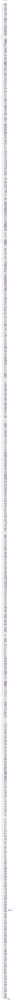

In [15]:
sq.pl.ligrec(cirr_res, source_groups="3", alpha=0.001)

### 3.1.4 DE results overlap

In [6]:
def sig_df(df, label, pts=0.15, pval=0.05, logfold=1):
    '''
    get significant up/down regulated genes. The DE method is from scanpy.
    '''
    df = df.query(f'{label}_pvals_adj < {pval} and \
        ({label}_logfoldchanges > {logfold} or {label}_logfoldchanges < -{logfold}) and pts_{label} > @pts')
    up_genes = df.query(f'{label}_logfoldchanges > 0')[f'{label}_names'].to_list()
    dn_genes = df.query(f'{label}_logfoldchanges < 0')[f'{label}_names'].to_list()
    return df, up_genes, dn_genes

In [25]:
fst_de_path = '/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/p01_visium_20220819/Analysis/f02_de'
fst_sene_vs_norm_fn = f'{fst_de_path}/more_sene_VS_norm.tsv'
fst_sene_vs_norm_df = pd.read_csv(fst_sene_vs_norm_fn, sep='\t', header=0)
fst_sene_vs_norm_df, fst_sene_vs_norm_up, fst_sene_vs_norm_dn  = sig_df(fst_sene_vs_norm_df, 'sene')
fst_sene_vs_norm_df.rename(columns = {'sene_names':'gene_symbol'}, inplace=True)
fst_sene_vs_norm_de = fst_sene_vs_norm_up + fst_sene_vs_norm_dn
print(fst_sene_vs_norm_df.shape)

fst_fibro_vs_norm_fn = f'{fst_de_path}/fibro_VS_norm.tsv'
fst_fibro_vs_norm_df = pd.read_csv(fst_fibro_vs_norm_fn, sep='\t', header=0)
fst_fibro_vs_norm_df, fst_fibro_vs_norm_up, fst_fibro_vs_norm_dn = sig_df(fst_fibro_vs_norm_df, 'fibro')
fst_fibro_vs_norm_df.rename(columns = {'fibro_names':'gene_symbol'}, inplace=True)
fst_fibro_vs_norm_de = fst_fibro_vs_norm_up + fst_fibro_vs_norm_dn
print(fst_fibro_vs_norm_df.shape)

(7948, 7)
(4730, 7)


In [26]:
snd_de_path = '/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/p02_visium_20230308/Analysis/f03_de/'
snd_sene_vs_norm_fn = f'{snd_de_path}/more_sene_VS_norm.tsv'
snd_sene_vs_norm_df = pd.read_csv(snd_sene_vs_norm_fn, sep='\t', header=0)
snd_sene_vs_norm_df, snd_sene_vs_norm_up, snd_sene_vs_norm_dn  = sig_df(snd_sene_vs_norm_df, 'sene')
snd_sene_vs_norm_df.rename(columns = {'sene_names':'gene_symbol'}, inplace=True)
snd_sene_vs_norm_de = snd_sene_vs_norm_up + snd_sene_vs_norm_dn
print(snd_sene_vs_norm_df.shape)

snd_fibro_vs_norm_fn = f'{snd_de_path}/fibro_VS_norm.tsv'
snd_fibro_vs_norm_df = pd.read_csv(snd_fibro_vs_norm_fn, sep='\t', header=0)
snd_fibro_vs_norm_df, snd_fibro_vs_norm_up, snd_fibro_vs_norm_dn  = sig_df(snd_fibro_vs_norm_df, 'fibro')
snd_fibro_vs_norm_df.rename(columns = {'fibro_names':'gene_symbol'}, inplace=True)
snd_fibro_vs_norm_de = snd_fibro_vs_norm_up + snd_fibro_vs_norm_dn
print(snd_fibro_vs_norm_df.shape)

(5683, 7)
(4360, 7)


In [13]:
prot_vs_norm_fn = '/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/proteomics/proteomics.HSC.tsv'
prot_vs_norm_df = pd.read_csv(prot_vs_norm_fn, sep='\t', header=0)
de_prots = prot_vs_norm_df['gene_symbol'].tolist()

In [27]:
import functools as ft
de_merge_df = ft.reduce(lambda left, right: pd.merge(left, right, how='left', on='gene_symbol'), [prot_vs_norm_df, fst_sene_vs_norm_df, fst_fibro_vs_norm_df, snd_sene_vs_norm_df, snd_fibro_vs_norm_df])

In [29]:
merge_de_fn = '/media/hpc/grid/wip_drm_targetsciences/projects/p051_senescence_esf/proteomics/proteomics_merge_with_visium.tsv'
de_merge_df.to_csv(merge_de_fn, sep='\t', index=False)

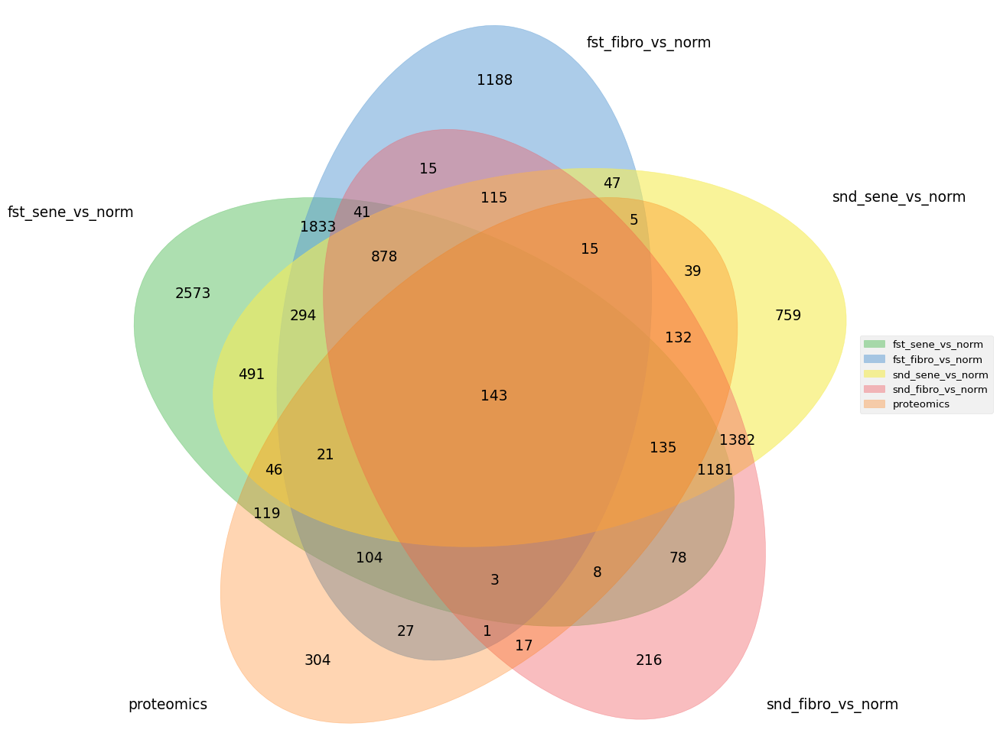

In [119]:
from pyvenn import venn
labels = venn.get_labels([fst_sene_vs_norm_de, fst_fibro_vs_norm_de, snd_sene_vs_norm_de, snd_fibro_vs_norm_de, de_prots], fill=['number'])
fig, ax = venn.venn5(labels, names=['fst_sene_vs_norm', 'fst_fibro_vs_norm', 'snd_sene_vs_norm', 'snd_fibro_vs_norm', 'proteomics'])
fig.show()

In [123]:
overlap_genes = set(fst_sene_vs_norm_de).intersection(fst_fibro_vs_norm_de).intersection(snd_sene_vs_norm_de).intersection(snd_fibro_vs_norm_de).intersection(de_prots)

In [126]:
prot_vs_norm_df.query('gene_symbol in @overlap_genes')

,id_main,gene_symbol,logfc_media_bleomycin_vs_control,logfc_media_doxorubicin_vs_control,logfc_media_etoposide_vs_control,logfc_cells_bleomycin_vs_control,logfc_cells_doxorubicin_vs_control,logfc_cells_etoposide_vs_control,logfc_se_media_bleomycin_vs_control,logfc_se_media_doxorubicin_vs_control,...,padj_media_etoposide_vs_control,padj_cells_bleomycin_vs_control,padj_cells_doxorubicin_vs_control,padj_cells_etoposide_vs_control,t_media_bleomycin_vs_control,t_media_doxorubicin_vs_control,t_media_etoposide_vs_control,t_cells_bleomycin_vs_control,t_cells_doxorubicin_vs_control,t_cells_etoposide_vs_control
5,P52823,STC1,2.221339,0.968666,2.038560,2.790520,0.806321,1.925987,0.124397,0.115169,...,2.100000e-09,1.190000e-08,1.191973e-03,2.470000e-07,17.856894,8.410824,17.700600,14.664163,4.576712,10.931984
15,P21980,TGM2,1.831037,0.974740,1.238894,1.000436,0.388585,0.390427,0.085822,0.079456,...,6.810000e-09,8.140000e-08,4.620000e-04,4.420000e-04,21.335328,12.267726,15.592275,12.241826,5.135900,5.160240
49,P01033,TIMP1,1.147343,0.977165,1.009644,2.551322,1.999134,2.390352,0.155639,0.144094,...,2.520000e-05,2.750000e-09,1.670000e-08,2.280000e-09,7.371808,6.781442,7.006844,16.754249,14.179963,16.954895
53,P55042,RRAD,1.101343,0.376142,0.843514,1.038841,0.615795,0.736496,0.098231,0.090944,...,1.450000e-06,8.620000e-07,7.790000e-05,1.320000e-05,11.211792,4.135969,9.275088,9.760218,6.249143,7.474024
87,Q9H3Q1,CDC42EP4,0.952207,0.510231,1.064846,-0.120058,-0.088999,-0.169209,0.158828,0.147046,...,1.810000e-05,4.247101e-01,5.231048e-01,2.154839e-01,5.995198,3.469865,7.241563,-0.989901,-0.792608,-1.506940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1111,P20908,COL5A1,-2.681395,-1.154244,-2.397753,-0.576990,-0.004371,-0.552406,0.170281,0.157650,...,8.660000e-09,1.480000e-04,9.703848e-01,1.080000e-04,-15.746865,-7.321574,-15.209373,-5.839399,-0.047779,-6.038538
1113,Q05707,COL14A1,-2.840934,-2.582724,-3.030923,-2.546679,-2.213214,-2.495406,0.173174,0.160328,...,1.290000e-09,1.120000e-10,1.120000e-10,3.180000e-11,-16.405044,-16.108967,-18.904475,-24.996906,-23.464370,-26.456149
1117,P23142,FBLN1,-3.021279,-2.274653,-2.851078,-0.410247,-0.410636,-0.489334,0.190041,0.175944,...,4.620000e-09,4.660000e-04,2.370000e-04,4.560000e-05,-15.898023,-12.928280,-16.204463,-5.130291,-5.546600,-6.609604
1118,P05997,COL5A2,-3.222724,-2.418328,-2.914997,-0.294634,0.619222,0.086444,0.212313,0.196564,...,1.090000e-08,2.433350e-03,1.130000e-06,2.792433e-01,-15.179120,-12.303026,-14.829788,-4.161512,9.446864,1.318786
